# Training dataset creation
The folder `data/pristine_images/patches` already provides the full products divided into `256x256` patches and divided according to the product they have been cropped from.  
This notebook simply divides the patches into `train, val, test` splits.  
It does so by creating a separate folder (i.e., `train_patches, val_patches, test_patches`) with a symlink to the patch files the split contains.  
We keep the patches inside the splits again divided according to the original product for organization.

## Libraries import

In [1]:
import rasterio
import numpy as np
import os
import ntpath
import glob
import matplotlib.pyplot as plt
import pandas as pd
import sys
sys.path.append('..')
from isplutils.PatchExtractor import PatchExtractor
from matplotlib import rc
rc('font',**{'family':'sans-serif','sans-serif':['Times']})
## for Palatino and other serif fonts use:
#rc('font',**{'family':'serif','serif':['Palatino']})
rc('text', usetex=True)

## Helpers functions

In [2]:
"""
Some image functions we are trying for normalizing 16-bit GRD images and convert them to 8-bits images.
For each scaling we provide the 8-bit conversion process too.

Authors:
Edoardo Daniele Cannas - edoardodaniele.cannas@polimi.it
"""
from sklearn.preprocessing import RobustScaler, QuantileTransformer


## Normalization functions

def raw_scaling(img: np.ndarray, conversion_8: bool = False) -> np.ndarray:
    """
    Standard min-max scaler

    :param img: np.ndarray, input image (tested GRD 16-bits)
    :param conversion_8: bool, wheter to convert to 8-bits depth
    :return: np.ndarray, normalized numpy array
    """
    norm = ((img-img.min())/(img.max()-img.min()))
    if conversion_8: # here
        norm = (norm*255).astype(np.uint8)
    return norm


def db_scaling(img: np.ndarray, conversion_8: bool = False) -> np.ndarray:
	"""
	Puts the image in logarithmic scale with a factor 10 
	
	:param img: np.ndarray, input image (tested GRD 16-bits)
	:param conversion_8: bool, wheter to convert to 8-bits depth
	:return: np.ndarray, normalized numpy array
	"""
	norm = np.log10(img)
	if conversion_8:
		norm = (norm-norm.min())/(norm.max()-norm.min())  # np.log10 provides the image already in float32, however the range may not be restricted 0-1
		norm = (norm*255).astype(np.uint8)
	return norm


def mul_scaling(img: np.ndarray,  mul_factor: int = 100, conversion_8: bool = False) -> np.ndarray:
	"""
	Simple scaling of the dynamic with a multiplicative factor
	
	:param img: np.ndarray, input image (tested GRD 16-bits)
	:param mul_factor: int, multiplicative factor for the scaling
	:param conversion_8: bool, wheter to convert to 8-bits depth
	:return: np.ndarray, normalized numpy array
	"""
	norm = ((img-img.min())/(img.max()-img.min()))
	norm *= mul_factor
	if conversion_8:
		norm = (norm*255).astype(np.uint8)
	return norm


def janos_scaling(img: np.ndarray, conversion_8: bool = False) -> np.ndarray:
	"""
	Nice dynamic scaling using exponential functions, original author Janos Horvath - horvath5@purdue.edu
	
	:param img: np.ndarray, input image (tested GRD 16-bits)
	:param conversion_8: bool, wheter to convert to 8-bits depth
	:return: np.ndarray, normalized numpy array
	"""
	norm = 2/((1+np.exp(-(img*40/256/256))))-1
	if conversion_8:
		norm = (norm*255).astype(np.uint8)
	return norm


def mz_scaling(img: np.ndarray, conversion_8: bool = False) -> np.ndarray:
    """
    Modified Z-score normalization taken from Sun et al, “DeepInSAR—A Deep Learning Framework for SAR Interferometric Phase Restoration and Coherence Estimation”

    :param img: np.ndarray, input image (tested GRD 16-bits)
    :param conversion_8: bool, wheter to convert to 8-bits depth
    :return: np.ndarray, normalized numpy array
    """
    shape = img.shape
    img = img.flatten()
    img_med = np.median(img)
    mad = np.median(np.abs(img - np.median(img)))
    #mad=0.1656
    mz = 0.6745 * ((img - np.median(img)) / mad)  # 0.6475 is the 75th quartile of the normal distribution, removes the outlier
    #mz = 0.6745 * ((a - 0.7097678) / mad)
    mz = (np.tanh(mz / 7) + 1) / 2
    mz_min = mz.min()
    mz_max = mz.max()
    mz = (mz - mz.min()) / (mz.max() - mz.min())
    norm = mz.reshape(shape)
    if conversion_8:
        norm = (norm*255).astype(np.uint8)
    return norm


## Range equalizers

def robust_scaling(img: np.ndarray) -> np.ndarray:
	"""
	RobustScaler: eliminates outliers, reproject the images in the same range
	
	:param img: np.ndarray, input image (tested GRD 16-bits)
	:return: np.ndarray, normalized numpy array
	"""
	return RobustScaler().fit_transform(img.reshape(-1, 1)).reshape(img.shape)
	

def quantile_scaling(img: np.ndarray, dist: str) -> np.ndarray:
	"""
	QuantileTransformer: maps the image range to a specific stastical distribution
	
	:param img: np.ndarray, input image (tested GRD 16-bits)
	:param distribution: str, distribution for mapping the image (either 'uniform' or 'normal')
	:return: np.ndarray, normalized numpy array
	"""
	return QuantileTransformer(output_distribution=dist).fit_transform(img.reshape(-1, 1)).reshape(img.shape)

def extract_patches(raster, mask, dim=(3, 256, 256)):
    # Let's instantiate the PatchExtractor
    pe = PatchExtractor(dim=dim)
    pe_mask = PatchExtractor(dim=dim)
    # Let's extract patches for both the images and masks
    img_patches = pe.extract(raster).reshape((-1,)+dim)
    mask_patches = pe_mask.extract(mask.astype(bool)).reshape((-1,)+dim)
    # Let's find patches with no data elements
    nodata_flags = np.array([np.sum(mask_patch)!=np.prod(dim) for mask_patch in mask_patches])
    # Let's pick only patches without no data elements
    img_patches = img_patches[~nodata_flags]
    return img_patches

### Hide warning
Small Javascript code to hide unwanted `python` warnings from the cell output.

In [8]:
%%javascript
(function(on) {
    const e = $("<a>Setup failed</a>");
    const ns = "js_jupyter_suppress_warnings";
    var cssrules = $("#" + ns);
    if(!cssrules.length)
        cssrules = $("<style id='" + ns + "' type='text/css'>div.output_stderr { } </style>").appendTo("head");
    e.click(function() {
        var s = 'Showing';
        cssrules.empty()
        if(on) {
            s = 'Hiding';
            cssrules.append("div.output_stderr, div[data-mime-type*='.stderr'] { display:none; }");
        }
        e.text(s + ' warnings (click to toggle)');
        on = !on;
    }).click();
    $(element).append(e);
})(true);

<IPython.core.display.Javascript object>

## Let's collect all the info on these products

In [5]:
DATA_ROOT = '../data/pristine_images'  # place here the root where you downloaded the data

# --- INPE images
bands = glob.glob(os.path.join(DATA_ROOT, 'full_res_products/**/*.tif*'), recursive=True)
bands = [band for band in bands if ('analytic_sr' not in band) and ('patches' not in band)]
data_df = pd.concat([pd.concat({acq.split('/')[4]: pd.DataFrame(index=[acq])}, names=['Original_product', 'Bands path']) for acq in bands])
# Let's pick up the sensors first and bands first
data_df['sensor'] = ''
data_df['bands_num'] = ''
for i, r in data_df.iterrows():
    data_df.loc[i, 'sensor'] = i[0].split('_')[2]
    if 'AMAZONIA' in i[0]:
        data_df.loc[i, 'sensor'] = 'AWFI'
    if 'L4_' in i[1]:
        data_df.loc[i, 'bands_num'] = i[1].split('L4_')[1].split('.')[0]
    else:
        data_df.loc[i, 'bands_num'] = i[1].split('L2_')[1].split('.')[0]

# --- Landsat bands
bands = glob.glob(os.path.join(DATA_ROOT, 'full_res_products/**/*.TIF'), recursive=True)
tmp_df = pd.concat([pd.concat({acq.split('/')[4]: pd.DataFrame(index=[acq])}, names=['Original_product', 'Bands path']) for acq in bands])
tmp_df['sensor'] = 'OLI'
data_df = pd.concat([data_df, tmp_df])
# Let's pick up the sensors first and bands first
for i, r in tmp_df.iterrows():
    data_df.loc[i, 'bands_num'] = i[1].split('/')[-1].split('_')[1].split('.')[0]
    

# --- Sentinel samples
bands = glob.glob(os.path.join(DATA_ROOT, 'full_res_products/**/IMG_DATA/R10m/*B0*.jp2'), recursive=True)
tmp_df = pd.concat([pd.concat({acq.split('/')[4]: pd.DataFrame(index=[acq])}, names=['Original_product', 'Bands path']) for acq in bands])
data_df = pd.concat([data_df, tmp_df])
# Let's pick up the sensors first and bands first
for i, r in tmp_df.iterrows():
    data_df.loc[i, 'bands_num'] = i[1].split('/')[-1].split('_')[-2]
    data_df.loc[i, 'sensor'] = i[0].split('_')[0]
    

# --- PlanetLab samples
bands = glob.glob(os.path.join(DATA_ROOT, 'full_res_products/**/*.tif'), recursive=True)
bands = [band for band in bands if ('analytic' in band) and ('udm.tif' not in band) and ('udm2.tif' not in band)]
tmp_df = pd.concat([pd.concat({acq.split('/')[4]: pd.DataFrame(index=[acq])}, names=['Original_product', 'Bands path']) for acq in bands])
data_df = pd.concat([data_df, tmp_df])
data_df

sensor  \
Original_product                                   Bands path                                                   
AMAZONIA_1_WFI_20220908_035_018                    ../data/pristine_images/full_res_products/AMAZO...    AWFI   
                                                   ../data/pristine_images/full_res_products/AMAZO...    AWFI   
                                                   ../data/pristine_images/full_res_products/AMAZO...    AWFI   
                                                   ../data/pristine_images/full_res_products/AMAZO...    AWFI   
CBERS_2B_CCD1XS_20090905_167_120                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
CBERS_2_CCD1XS_20081230_156_116                    ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
CBERS_4A_MUX_20220906_198_122                      ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
CBERS_4A_WFI_20220905_223_124                      ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
CBERS_4A_WFI_20220908_210_132                      ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
CBERS_4_MUX_20220908_150_123                       ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
CBERS_4_PAN10M_20220905_151_116                    ../data/pristine_images/full_res_products/CBERS...  PAN10M   
                                                   ../data/pristine_images/full_res_products/CBERS...  PAN10M   
                                                   ../data/pristine_images/full_res_products/CBERS...  PAN10M   
LO82240772021365CUB00                              ../data/pristine_images/full_res_products/LO822...     OLI   
                                                   ../data/pristine_images/full_res_products/LO822...     OLI   
                                   

### Add height and width

In [6]:
# We can add some information in between too
for product in data_df.index.get_level_values(0).unique():
    # Select the product
    df = data_df.loc[product]
    fsize = 20
    for idx, band in enumerate(df.index.get_level_values(0).unique()):
        # Load the band
        with rasterio.open(band, 'r') as src:
            # Add info
            data_df.loc[(product, band), 'height'] = src.profile['height']
            data_df.loc[(product, band), 'width'] = src.profile['width']
            data_df.loc[(product, band), 'bit_depth'] = src.profile['dtype']
data_df

sensor  \
Original_product                                   Bands path                                                   
AMAZONIA_1_WFI_20220908_035_018                    ../data/pristine_images/full_res_products/AMAZO...    AWFI   
                                                   ../data/pristine_images/full_res_products/AMAZO...    AWFI   
                                                   ../data/pristine_images/full_res_products/AMAZO...    AWFI   
                                                   ../data/pristine_images/full_res_products/AMAZO...    AWFI   
CBERS_2B_CCD1XS_20090905_167_120                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
CBERS_2_CCD1XS_20081230_156_116                    ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
CBERS_4A_MUX_20220906_198_122                      ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
CBERS_4A_WFI_20220905_223_124                      ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
CBERS_4A_WFI_20220908_210_132                      ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
CBERS_4_MUX_20220908_150_123                       ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
CBERS_4_PAN10M_20220905_151_116                    ../data/pristine_images/full_res_products/CBERS...  PAN10M   
                                                   ../data/pristine_images/full_res_products/CBERS...  PAN10M   
                                                   ../data/pristine_images/full_res_products/CBERS...  PAN10M   
LO82240772021365CUB00                              ../data/pristine_images/full_res_products/LO822...     OLI   
                                                   ../data/pristine_images/full_res_products/LO822...     OLI   
                                   

### Add sensor info

In [7]:
# Let's add a more comprehensible definition for bands
bands_dict = {sensor: dict() for sensor in data_df['sensor'].unique()}
bands_dict['PAN10M'] = {'BAND3': 'Red', 'BAND4': 'NIR', 'BAND2': 'Green'}
bands_dict['MUX'] = {'BAND5': 'Blue', 'BAND6': 'Green', 'BAND7': 'Red', 'BAND8': 'NIR'}
bands_dict['WFI'] = {'BAND13': 'Blue', 'BAND14': 'Green', 'BAND15': 'Red', 'BAND16': 'NIR'}
bands_dict['CCD1XS'] = {'BAND1': 'Blue', 'BAND2': 'Green', 'BAND3': 'Red', 'BAND4': 'NIR', 'BAND5': 'PAN'}
bands_dict['AWFI'] = {'BAND1': 'Blue', 'BAND2': 'Green', 'BAND3': 'Red', 'BAND4': 'NIR'}
bands_dict['OLI'] = {'B1': 'Coastal aerosol', 'B2': 'Blue', 'B3': 'Green', 'B4': 'Red'}
bands_dict['S2A'] = {'B02': 'Blue', 'B03': 'Green', 'B04': 'Red', 'B08': 'NIR'}
bands_dict['S2B'] = {'B02': 'Blue', 'B03': 'Green', 'B04': 'Red', 'B08': 'NIR'}
no_pl_df = data_df.drop(['PlanetScope_Campinas_psorthotile_analytic_sr_udm2',
                         'RapidEye2_Santos_reorthotile_analytic_sr',
                         'RapidEye4_Sao_Miguel_Arcangeo_reorthotile_analytic_sr'])
for i in no_pl_df.index:
    data_df.loc[i, 'bands_name'] = bands_dict[no_pl_df.loc[i, 'sensor']][no_pl_df.loc[i, 'bands_num']]
data_df.loc['PlanetScope_Campinas_psorthotile_analytic_sr_udm2', 'sensor'] = 'PSB.SD'
data_df.loc['PlanetScope_Campinas_psorthotile_analytic_sr_udm2', 'bands_name'] = 'RGBN'
data_df.loc['RapidEye2_Santos_reorthotile_analytic_sr', 'sensor'] = 'JSS 56'
data_df.loc['RapidEye2_Santos_reorthotile_analytic_sr', 'bands_name'] = 'RGBReN'
data_df.loc['RapidEye4_Sao_Miguel_Arcangeo_reorthotile_analytic_sr', 'sensor'] = 'JSS 56'
data_df.loc['RapidEye4_Sao_Miguel_Arcangeo_reorthotile_analytic_sr', 'bands_name'] = 'RGBReN'
data_df

/nas/home/ecannas/miniconda3/envs/overhead-norm-strategies/lib/python3.7/site-packages/pandas/core/generic.py:4150: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


sensor  \
Original_product                                   Bands path                                                   
AMAZONIA_1_WFI_20220908_035_018                    ../data/pristine_images/full_res_products/AMAZO...    AWFI   
                                                   ../data/pristine_images/full_res_products/AMAZO...    AWFI   
                                                   ../data/pristine_images/full_res_products/AMAZO...    AWFI   
                                                   ../data/pristine_images/full_res_products/AMAZO...    AWFI   
CBERS_2B_CCD1XS_20090905_167_120                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
CBERS_2_CCD1XS_20081230_156_116                    ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
                                                   ../data/pristine_images/full_res_products/CBERS...  CCD1XS   
CBERS_4A_MUX_20220906_198_122                      ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
CBERS_4A_WFI_20220905_223_124                      ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
CBERS_4A_WFI_20220908_210_132                      ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
                                                   ../data/pristine_images/full_res_products/CBERS...     WFI   
CBERS_4_MUX_20220908_150_123                       ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
                                                   ../data/pristine_images/full_res_products/CBERS...     MUX   
CBERS_4_PAN10M_20220905_151_116                    ../data/pristine_images/full_res_products/CBERS...  PAN10M   
                                                   ../data/pristine_images/full_res_products/CBERS...  PAN10M   
                                                   ../data/pristine_images/full_res_products/CBERS...  PAN10M   
LO82240772021365CUB00                              ../data/pristine_images/full_res_products/LO822...     OLI   
                                                   ../data/pristine_images/full_res_products/LO822...     OLI   
                                   

## Let's divide the patches in training and testing
We'll use simple symbolic links.  
We will not use for the moment:
1. S2A_MSIL2A_20220912T081611_N0400_R121_T35LLL_20220912T125758;
2. CBERS_4A_WFI_20220905_223_124;
3. all CBERS2 products.

In [10]:
from sklearn.model_selection import train_test_split

DATA_ROOT = '../data/pristine_images/patches'
SAVE_PATH = '../data/pristine_images/train_splits'  # PUT YOUR PATH for saving the splits here!

# Cycle over the products
for product in data_df.drop(['S2A_MSIL2A_20220912T081611_N0400_R121_T35LLL_20220912T125758',
              'CBERS_4A_WFI_20220905_223_124', 'CBERS_2B_CCD1XS_20090905_167_120',
              'CBERS_2_CCD1XS_20081230_156_116', 'CBERS_4_PAN10M_20220905_151_116']).index.get_level_values(0).unique():
    
    # Avoid symlinking twice the same data
    if product not in ['train_patches', 'val_patches', 'test_patches']:
        # Create directories
        os.makedirs(os.path.join(SAVE_PATH, 'train_patches', product), exist_ok=True)
        os.makedirs(os.path.join(SAVE_PATH, 'val_patches', product), exist_ok=True)
        os.makedirs(os.path.join(SAVE_PATH, 'test_patches', product), exist_ok=True)
        
        # Create the splits
        all_patches = glob.glob(os.path.join(DATA_ROOT, product, '*.tiff'))
        test_split, trainval_split = train_test_split(all_patches, test_size=0.75, random_state=np.random.seed(42))
        val_split, train_split = train_test_split(trainval_split, test_size=0.50, random_state=np.random.seed(42))
        print(f'Product {product} - Train split: {len(train_split)} - Val split : {len(val_split)} - Test split: {len(test_split)}')
        
        # Create the symlinks
        for path in train_split:
            os.symlink(path, os.path.join(SAVE_PATH, 'train_patches', product, os.path.split(path)[-1]))
        for path in val_split:
            os.symlink(path, os.path.join(SAVE_PATH, 'val_patches', product, os.path.split(path)[-1]))
        for path in test_split:
            os.symlink(path, os.path.join(SAVE_PATH, 'test_patches', product, os.path.split(path)[-1]))
        
        # Let's just check that we've done everything good
        train_patches = glob.glob(os.path.join(SAVE_PATH, 'train_patches', product, '*.tiff'))
        val_patches = glob.glob(os.path.join(SAVE_PATH, 'val_patches', product, '*.tiff'))
        test_patches = glob.glob(os.path.join(SAVE_PATH,'test_patches', product, '*.tiff'))
        print(f'Train split is correct? {len(train_split)==len(train_patches)}\nVal split is correct? {len(val_split)==len(val_patches)}\nTrain split is correct? {len(test_split)==len(test_patches)}')
        
        # Copy also the ProductScalers
        all_scalers = glob.glob(os.path.join(DATA_ROOT, product, '*.joblib'))
        for scaler in all_scalers:
            os.symlink(scaler, os.path.join(SAVE_PATH, 'train_patches', product, os.path.split(scaler)[-1]))
            os.symlink(scaler, os.path.join(SAVE_PATH, 'val_patches', product, os.path.split(scaler)[-1]))
            os.symlink(scaler, os.path.join(SAVE_PATH, 'test_patches', product, os.path.split(scaler)[-1]))
            


Product AMAZONIA_1_WFI_20220908_035_018 - Train split: 879 - Val split : 878 - Test split: 585
Train split is correct? True
Val split is correct? True
Train split is correct? True
Product CBERS_4A_MUX_20220906_198_122 - Train split: 187 - Val split : 187 - Test split: 124
Train split is correct? True
Val split is correct? True
Train split is correct? True
Product CBERS_4A_WFI_20220908_210_132 - Train split: 966 - Val split : 966 - Test split: 644
Train split is correct? True
Val split is correct? True
Train split is correct? True
Product CBERS_4_MUX_20220908_150_123 - Train split: 116 - Val split : 115 - Test split: 76
Train split is correct? True
Val split is correct? True
Train split is correct? True
Product LO82240772021365CUB00 - Train split: 218 - Val split : 218 - Test split: 145
Train split is correct? True
Val split is correct? True
Train split is correct? True
Product S2A_MSIL2A_20220912T081611_N0400_R121_T37SBA_20220912T114902 - Train split: 662 - Val split : 661 - Test split

### Inspect some of the patches

#### Train split

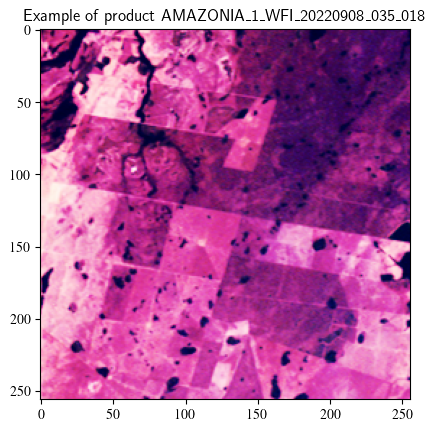

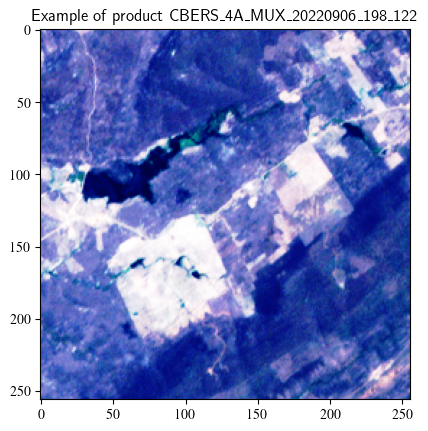

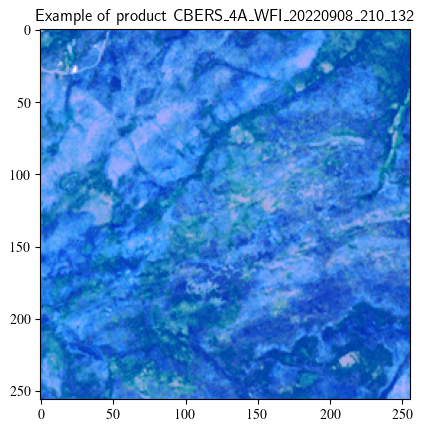

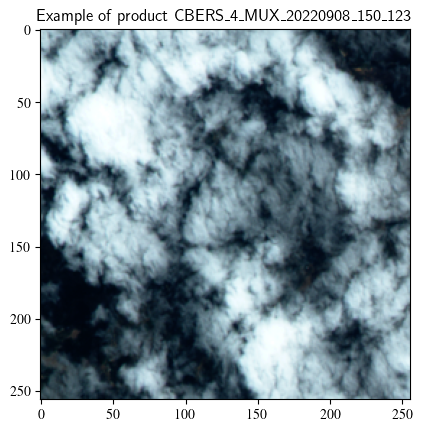

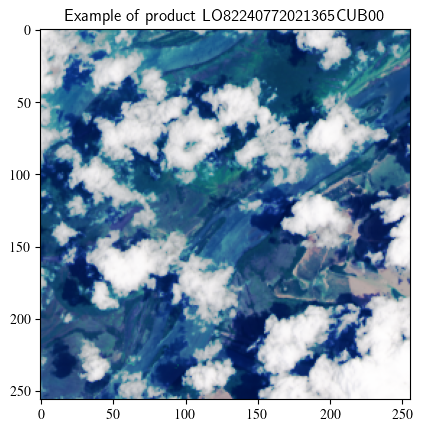

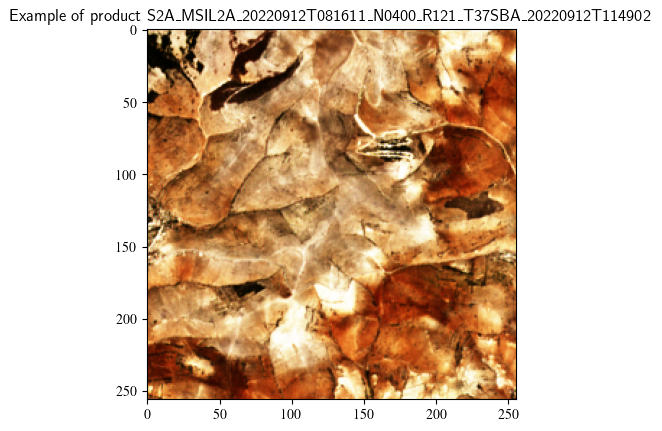

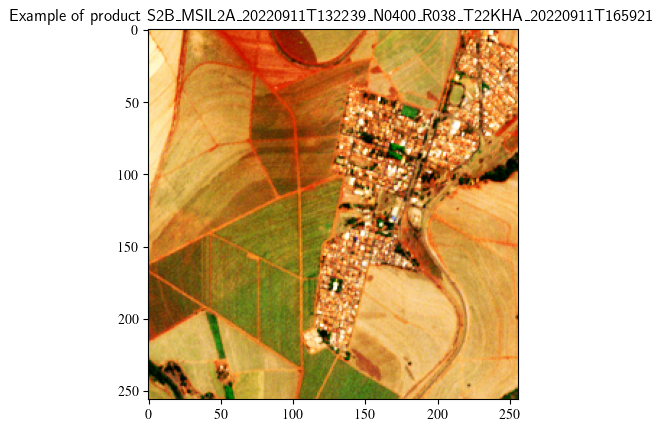

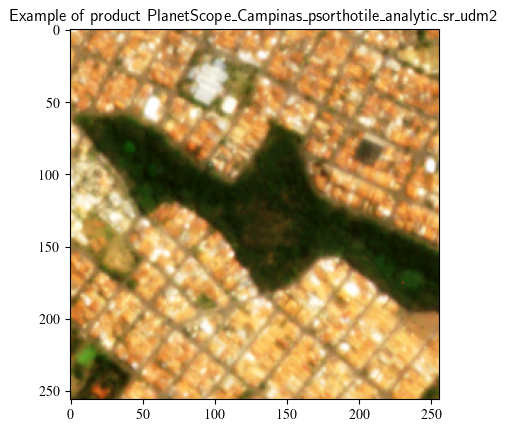

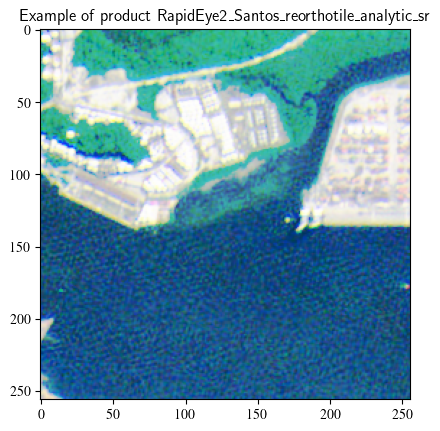

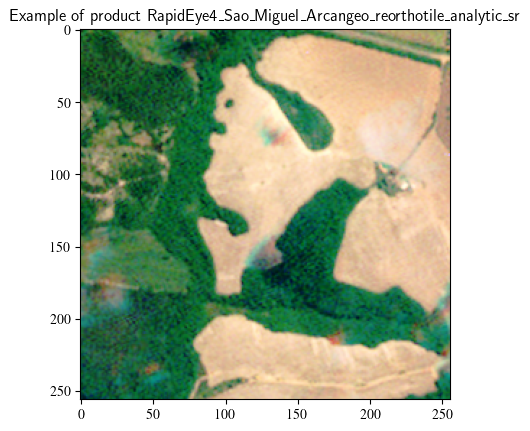

In [12]:
for product in os.listdir(os.path.join(SAVE_PATH, 'train_patches')):
    image_path = sorted(glob.glob(os.path.join(SAVE_PATH, 'train_patches', product, '*.tiff')))[0]
    with rasterio.open(image_path, 'r') as src:
        img = src.read()
    plt.imshow(quantile_scaling(np.moveaxis(img, 0, 2), 'uniform'))
    plt.title(f'Example of product {product}')
    plt.show()

#### Val split

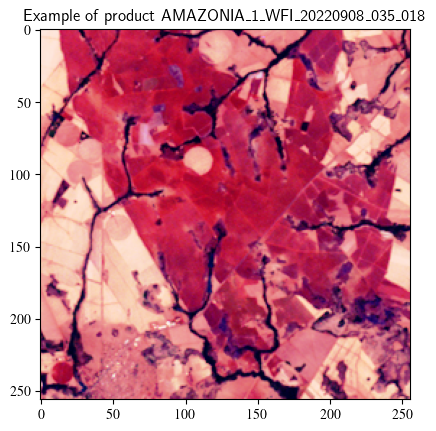

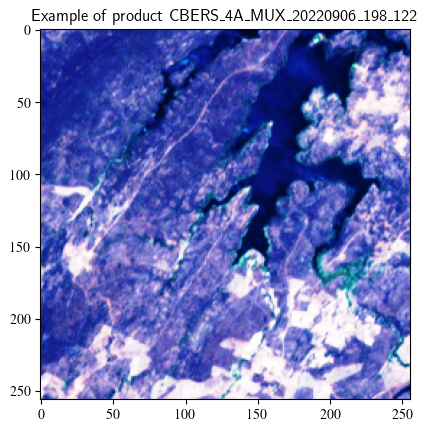

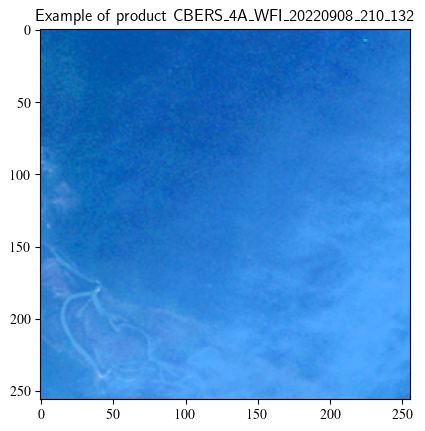

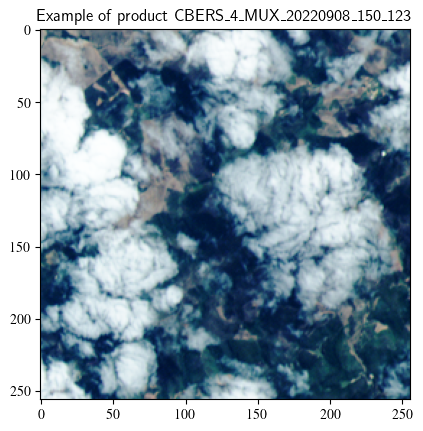

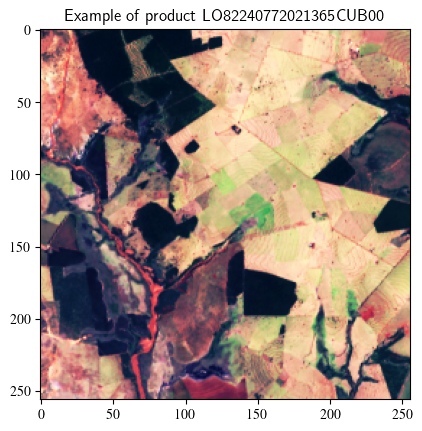

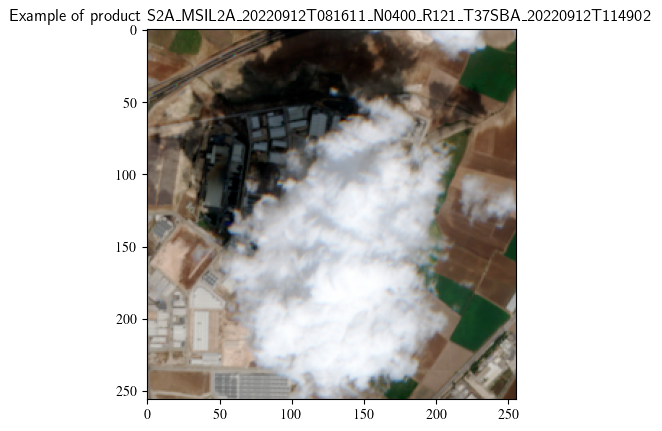

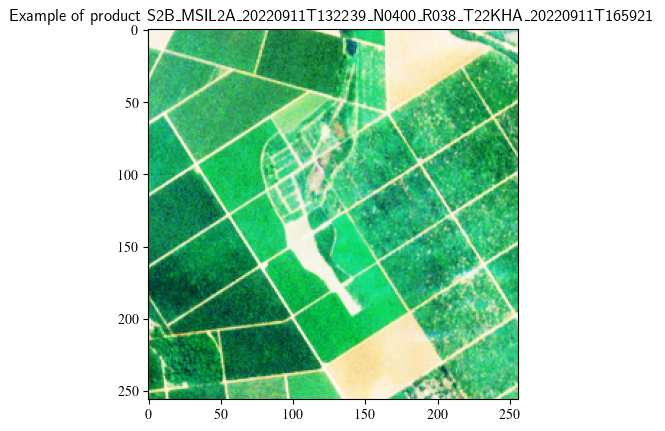

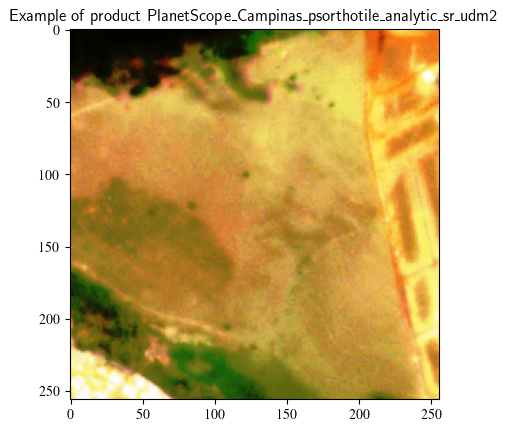

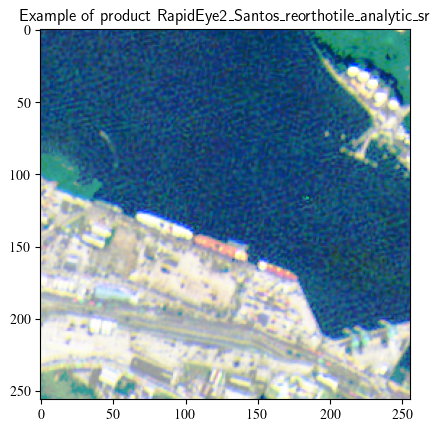

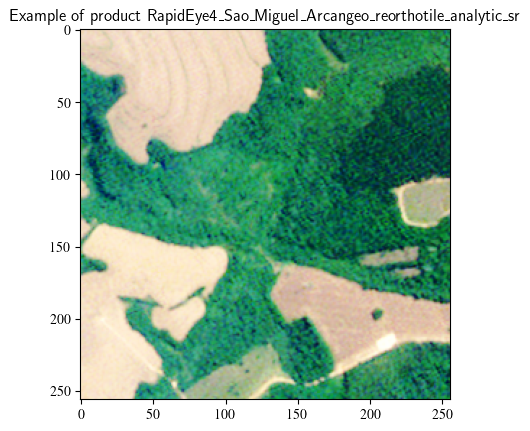

In [13]:
for product in os.listdir(os.path.join(SAVE_PATH, 'val_patches')):
    image_path = sorted(glob.glob(os.path.join(SAVE_PATH, 'val_patches', product, '*.tiff')))[0]
    with rasterio.open(image_path, 'r') as src:
        img = src.read()
    plt.imshow(quantile_scaling(np.moveaxis(img, 0, 2), 'uniform'))
    plt.title(f'Example of product {product}')
    plt.show()

#### Test split

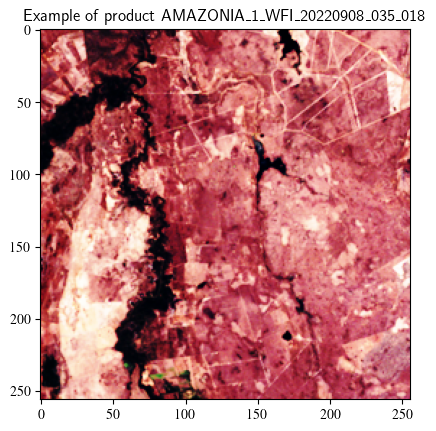

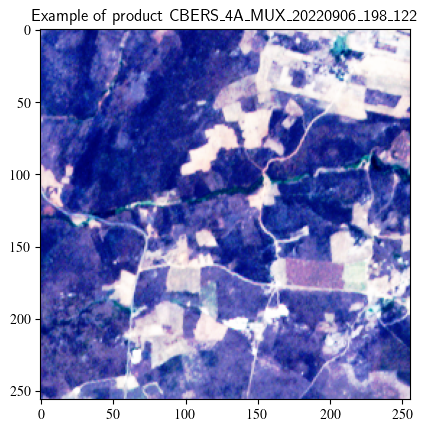

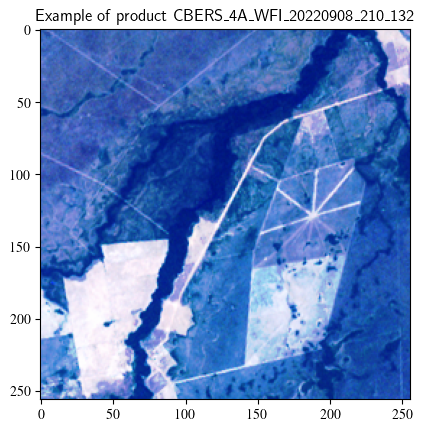

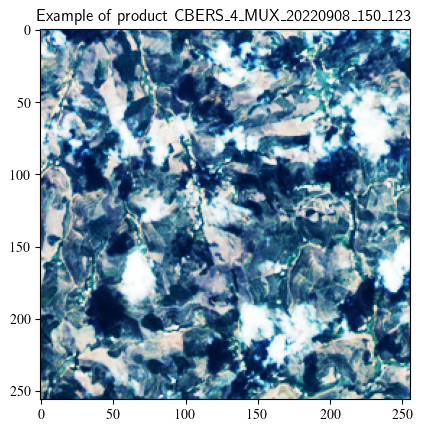

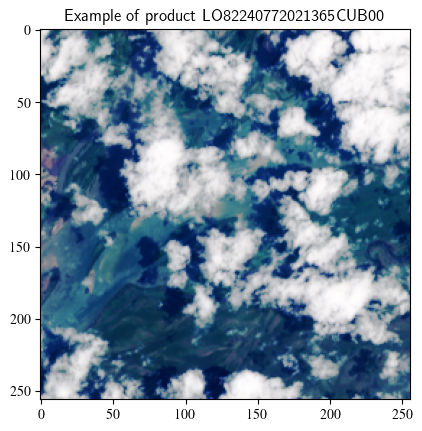

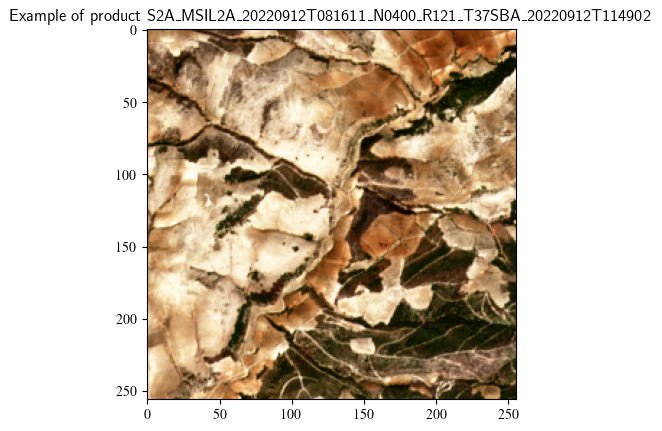

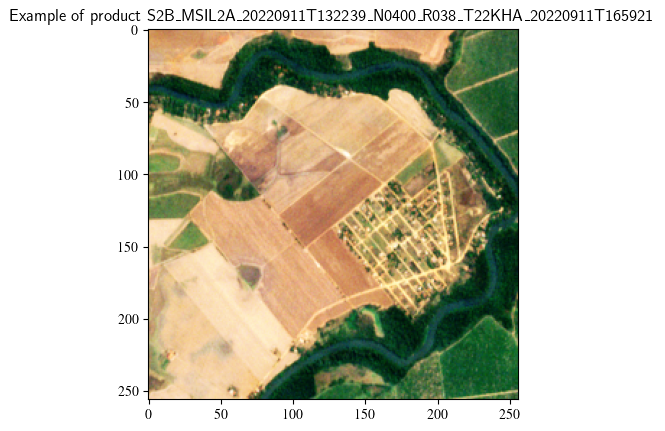

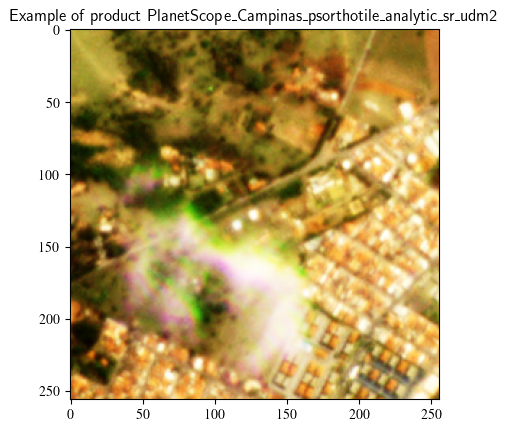

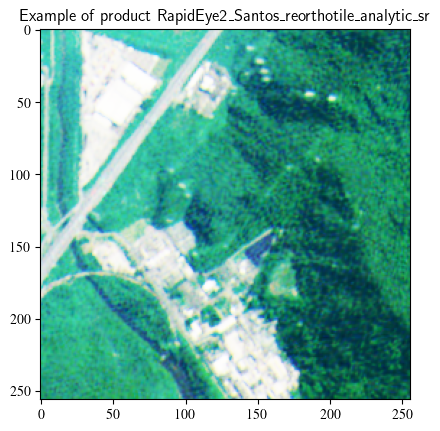

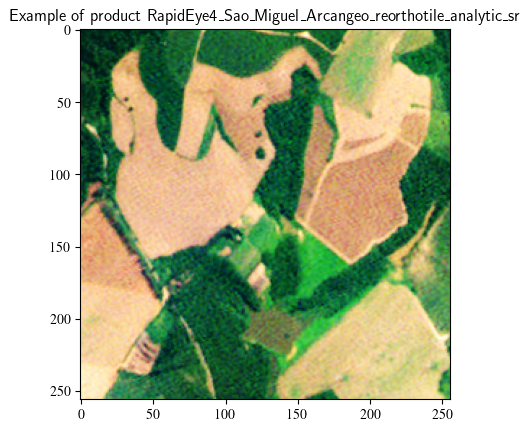

In [14]:
for product in os.listdir(os.path.join(SAVE_PATH, 'test_patches')):
    image_path = sorted(glob.glob(os.path.join(SAVE_PATH, 'test_patches', product, '*.tiff')))[0]
    with rasterio.open(image_path, 'r') as src:
        img = src.read()
    plt.imshow(quantile_scaling(np.moveaxis(img, 0, 2), 'uniform'))
    plt.title(f'Example of product {product}')
    plt.show()